In [1]:
import os
import numpy as np
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.patheffects as PathEffects
from scipy.spatial.distance import squareform

import sys  
sys.path.append('../')
from ABIDE import load_data_fmri, load_meta_df
from plot_utils import *

In [2]:
X, _, _ = load_data_fmri()
X_harmonized, _, _ = load_data_fmri(harmonized=True)
meta_df = load_meta_df()

# Individual Scans

In [3]:
dx_group = meta_df["DX_GROUP"].values
genders = meta_df["SEX"].values
diseased_idx = np.argwhere(dx_group == 1).flatten()
normal_idx = np.argwhere(dx_group == 2).flatten()
male_idx = np.argwhere(genders == 1).flatten()
female_idx = np.argwhere(genders == 2).flatten()

In [4]:
def random_choice(choices, n=1):
    np.random.seed(0)
    return np.random.choice(choices, size=n, replace=False)

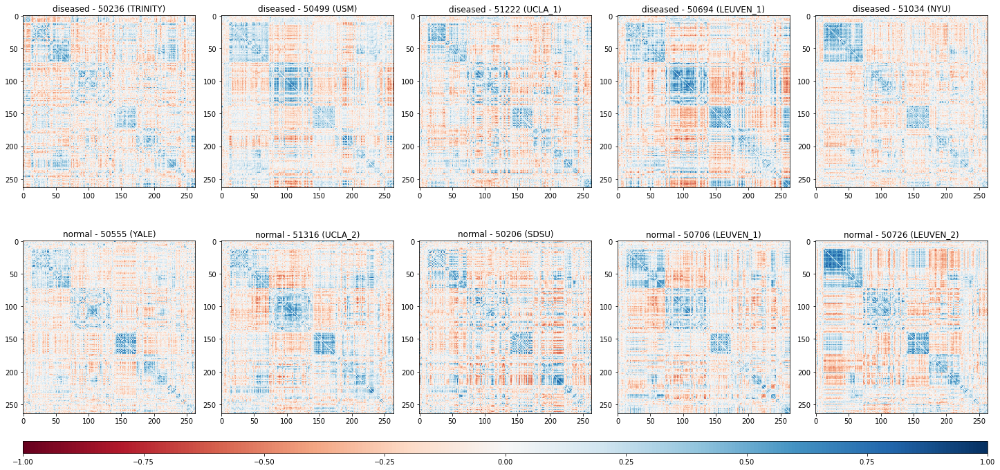

In [5]:
# original correlation matrix
n = 5
f, ax = plt.subplots(2, n, figsize=(int(5 * n), 15))
plt.subplots_adjust(wspace=0.15, hspace=0.)

d_idx = random_choice(diseased_idx, n)
n_idx = random_choice(normal_idx, n)

for i, idx in enumerate(d_idx):
    ax[0][i].set_title("diseased - {} ({})".format(
        meta_df.loc[idx, "SUB_ID"], meta_df.loc[idx, "SITE_ID"]
    ))
    im = ax[0][i].imshow(X[idx], vmin=-1, vmax=1, cmap='RdBu')

for i, idx in enumerate(n_idx):
    ax[1][i].set_title("normal - {} ({})".format(
        meta_df.loc[idx, "SUB_ID"], meta_df.loc[idx, "SITE_ID"]
    ))
    im = ax[1][i].imshow(X[idx], vmin=-1, vmax=1, cmap='RdBu')

f.colorbar(im, ax=ax, orientation='horizontal', pad=0.05, aspect=80)
print()

The values within the same class varies a lot as well

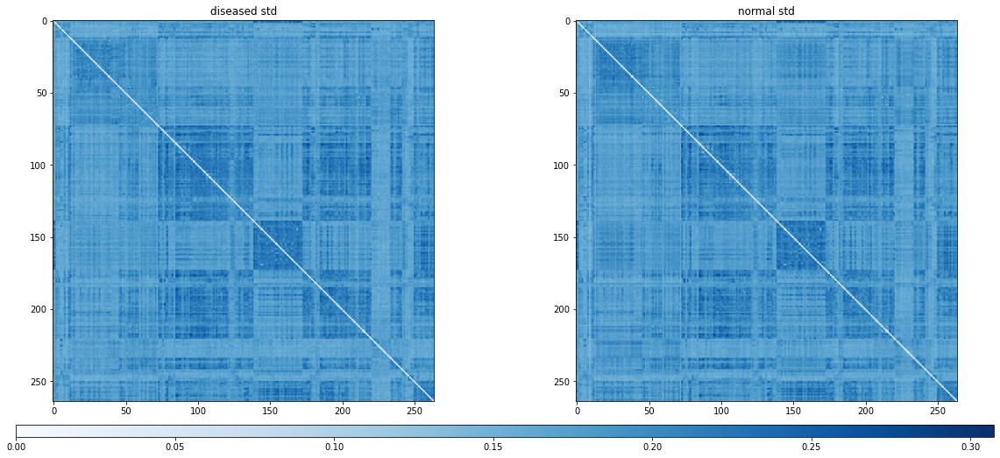

In [6]:
diseased_std = np.std(X[diseased_idx], axis=0)
normal_std = np.std(X[normal_idx], axis=0)
max_std = max(np.max(diseased_std), np.max(normal_std))

f, ax = plt.subplots(1, 2, figsize=(20, 10))
plt.subplots_adjust(wspace=0.15, hspace=0.)

ax[0].set_title("diseased std")
im = ax[0].imshow(diseased_std, vmin=0, vmax=max_std, cmap='Blues')
ax[1].set_title("normal std")
im = ax[1].imshow(normal_std, vmin=0, vmax=max_std, cmap='Blues')

f.colorbar(im, ax=ax, orientation='horizontal', pad=0.05, aspect=80)
print()

# Average Scans

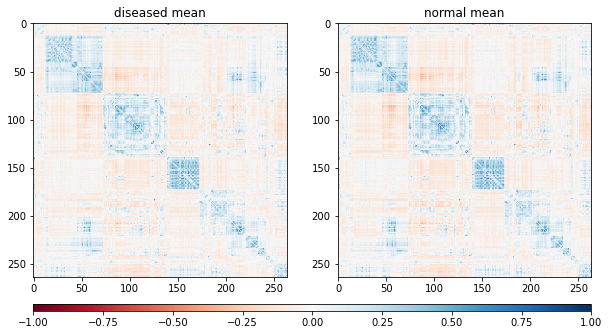

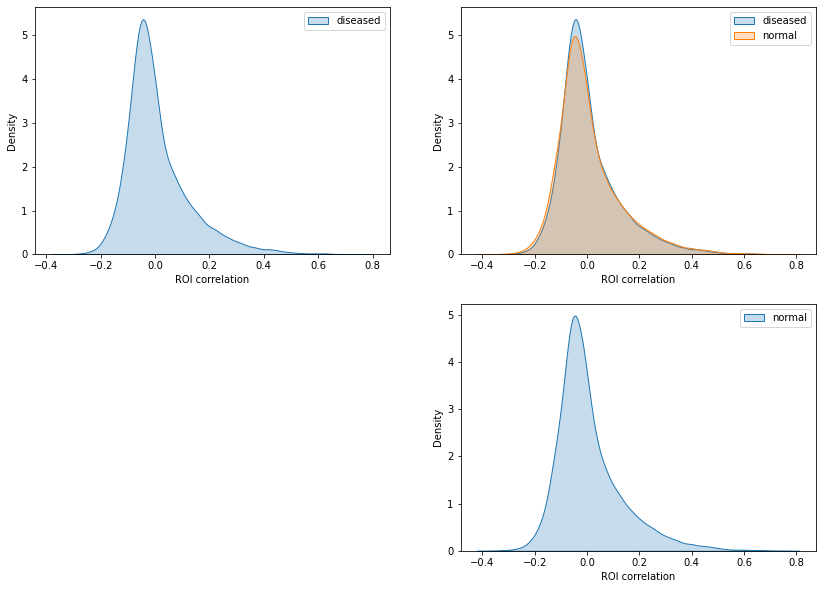

In [7]:
class_mean = get_group_distribution(
    X, meta_df["DX_GROUP"].apply(lambda x: "diseased" if x == 1 else "normal").values,
    fisher=False
)
plot_group_corr_mat(class_mean)
plot_group_kde(class_mean)
print()

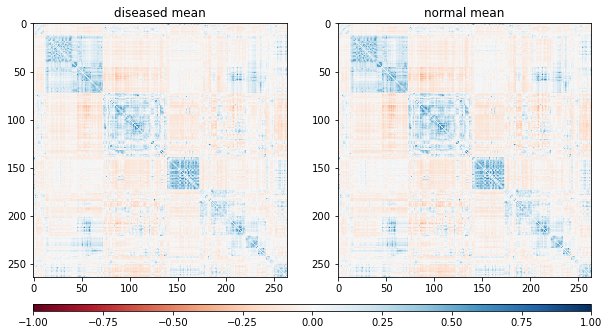

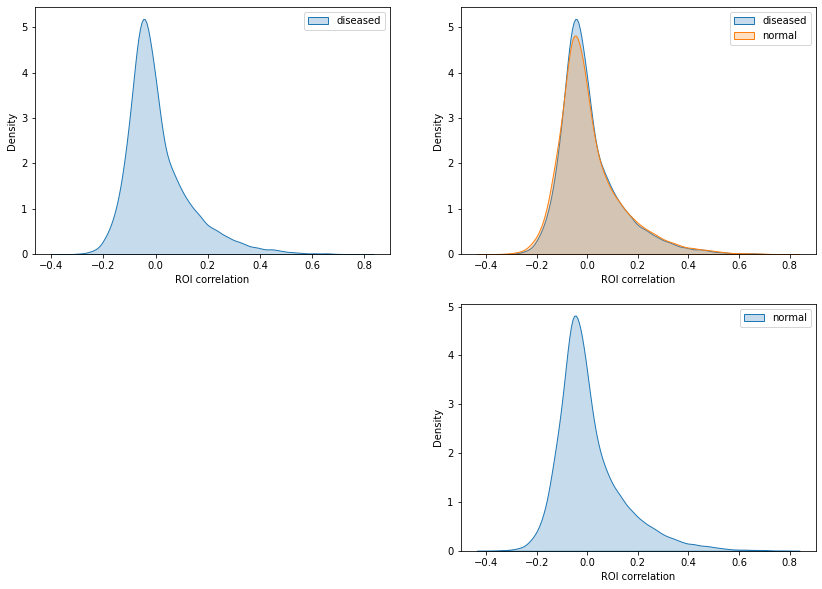

In [8]:
class_mean = get_group_distribution(
    X, meta_df["DX_GROUP"].apply(lambda x: "diseased" if x == 1 else "normal").values,
    fisher=True
)
plot_group_corr_mat(class_mean)
plot_group_kde(class_mean)
print()

# Site Differences

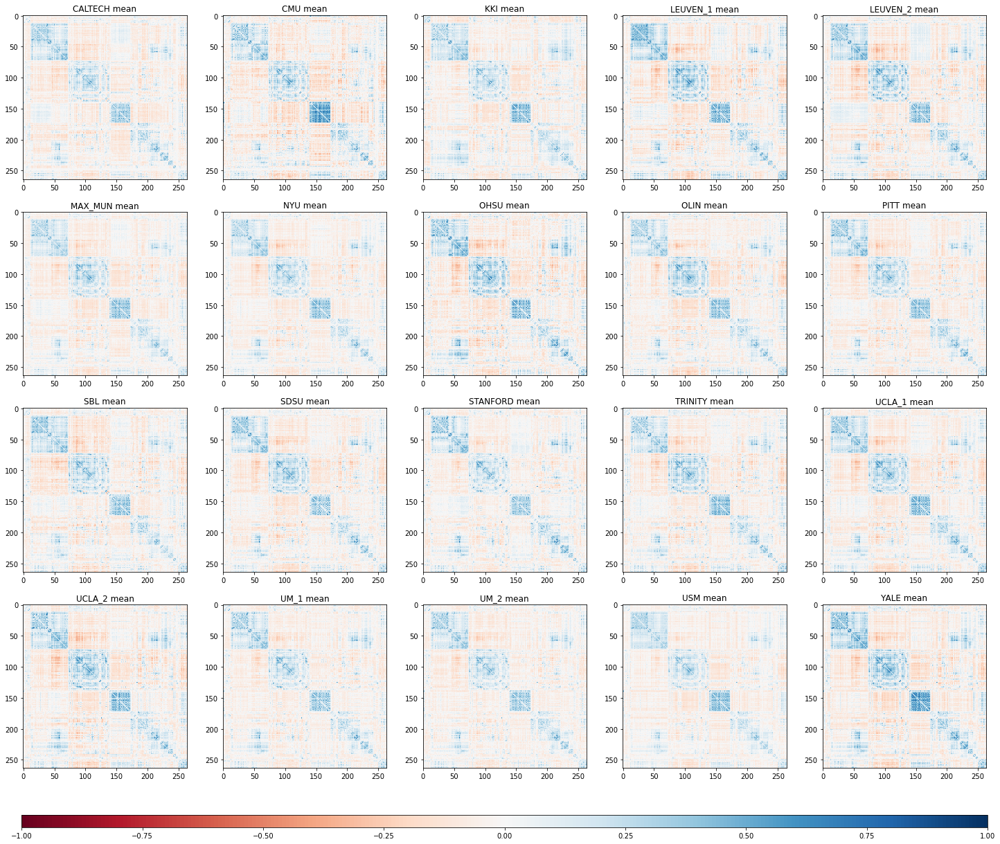

In [16]:
site_mean = get_group_distribution(
    X, meta_df["SITE_ID"].values,
    fisher=True
)
plot_group_corr_mat(site_mean)
print()

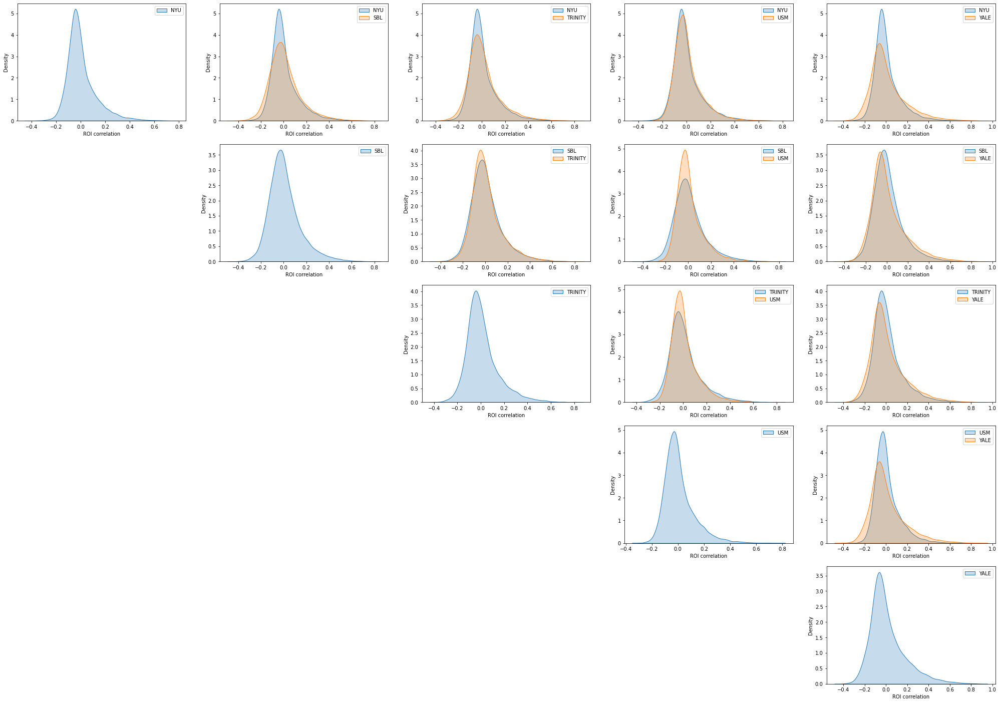

In [20]:
choosen_sites = ["SBL", "USM", "NYU", "TRINITY", "YALE"]
choosen_site_mean = {k: v for k, v in site_mean.items() if k in choosen_sites}
plot_group_kde(choosen_site_mean)
print()

# After ComBat Harmonization

In [21]:
site_hmean = get_group_distribution(
    X_harmonized, meta_df["SITE_ID"].values,
    fisher=True
)

/data/yeww0006/FYP-SSL/src/ABIDE/../plot_utils.py:19: RuntimeWarning: invalid value encountered in arctanh
  X = np.arctanh(X)


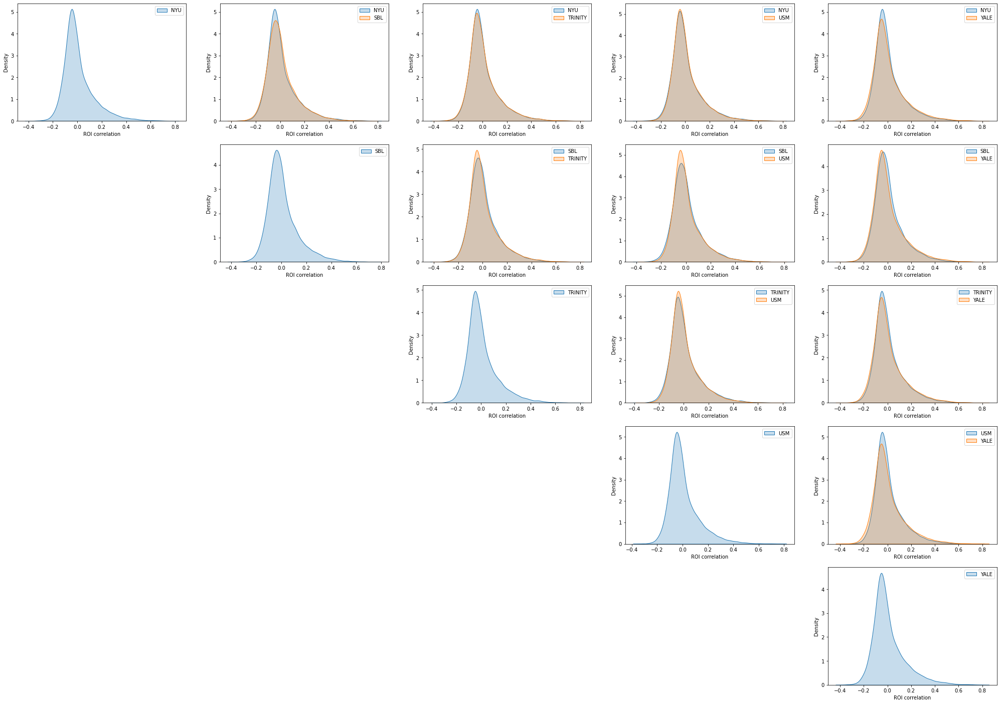

In [22]:
choosen_sites = ["SBL", "USM", "NYU", "TRINITY", "YALE"]
choosen_site_mean = {k: v for k, v in site_hmean.items() if k in choosen_sites}
plot_group_kde(choosen_site_mean)
print()